In [2]:
import pandas as pd
import numpy as np

In [14]:
df=pd.read_csv(r"C:\Users\Kinjalk Parth\Desktop\Recommeder System\Practical\STAMP_analysis\STAMP_DATA_TRAIN.txt")

In [3]:
df

,SessionID,Time,ItemID
0,9773199,1.410057e+09,214853760
1,9773199,1.410057e+09,214687970
2,9773199,1.410057e+09,214853762
3,9773199,1.410057e+09,214717867
4,9773199,1.410057e+09,214853762
...,...,...,...
1987438,11299813,1.411556e+09,214839347
1987439,11299813,1.411556e+09,214835000
1987440,11299813,1.411557e+09,214828970
1987441,11299813,1.411557e+09,214828970


In [4]:
a=df.SessionID.unique()
a

array([ 9773199,  9773194,  9773238, ..., 11299828, 11299827, 11299813],
      dtype=int64)

In [6]:
df.dtypes

SessionID      int64
Time         float64
ItemID         int64
dtype: object

In [5]:
len(a)

229364

There are a total of 229364 rows in our dataset.

In [50]:
test_df=df.groupby("SessionID").count()
test_df=test_df.sort_values(['ItemID'],ascending=True)
test_df

,Time,ItemID
SessionID,,
10762053,5,5
10743349,5,5
10743323,5,5
10743317,5,5
10743311,5,5
...,...,...
10289792,176,176
10977131,181,181
10988954,185,185


Minimum No of clicks is 5 as we have processed the data in accordane to latest finfings published in the papers STAMP/NARM/GRU4REC+/Graph based attention model

In [16]:
new_df=df.groupby("SessionID").mean()
new_df

,Time,ItemID
SessionID,,
9764869,1.409743e+09,2.146809e+08
9764883,1.409847e+09,2.148512e+08
9764884,1.409931e+09,2.148458e+08
9764893,1.410015e+09,2.147580e+08
9764899,1.410149e+09,2.147787e+08
...,...,...
11562101,1.411742e+09,2.147918e+08
11562103,1.411612e+09,2.148548e+08
11562114,1.411528e+09,2.148483e+08


In [12]:
import matplotlib.pyplot as plt

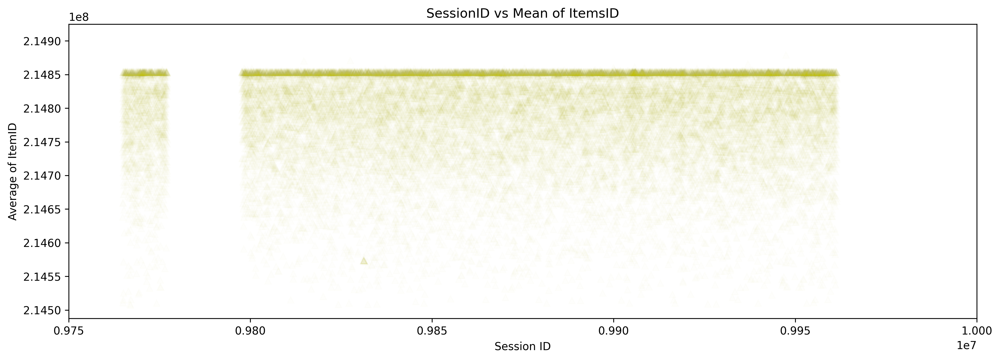

In [109]:
plt.figure(figsize=(15,5),dpi=300)
plt.plot(df.SessionID.unique(),new_df.ItemID, 'y^', alpha=0.01)
plt.title("SessionID vs Mean of ItemsID")
plt.xlabel("Session ID")
plt.ylabel("Average of ItemID")
plt.xlim(0.975e7, 1.0e7)
plt.show()

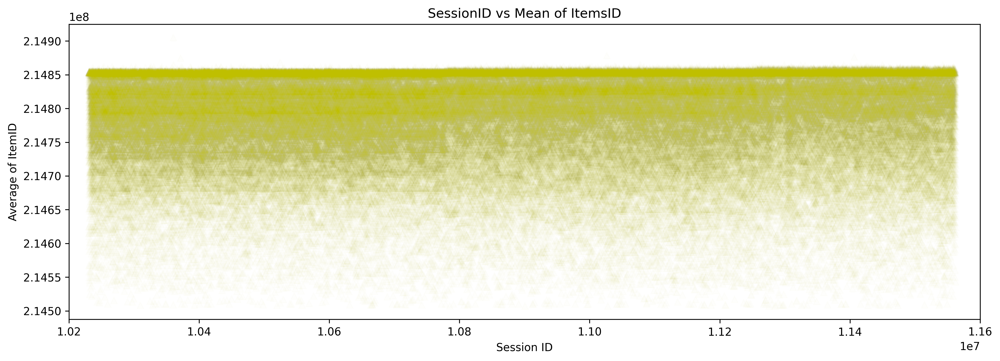

In [110]:
plt.figure(figsize=(15,5),dpi=300)
plt.plot(df.SessionID.unique(),new_df.ItemID,'y^',alpha=0.01)
plt.title("SessionID vs Mean of ItemsID")
plt.xlabel("Session ID")
plt.ylabel("Average of ItemID")
plt.xlim(1.02e7,1.16e7)
plt.show()

Many of these sessions are very similar, as points lie on the same average of item IDs, this can generalize the fact that many sequences have taken the same path, becasue of this the chances of overfitting by our selected model is going to be quite high.
This can also be a possible reason for why Graph based attention mechanism outperform external memory based analysis such as STAMP.

### Mean of ItemID represents in a sense where these items the user is interested in buying lies in very general sense


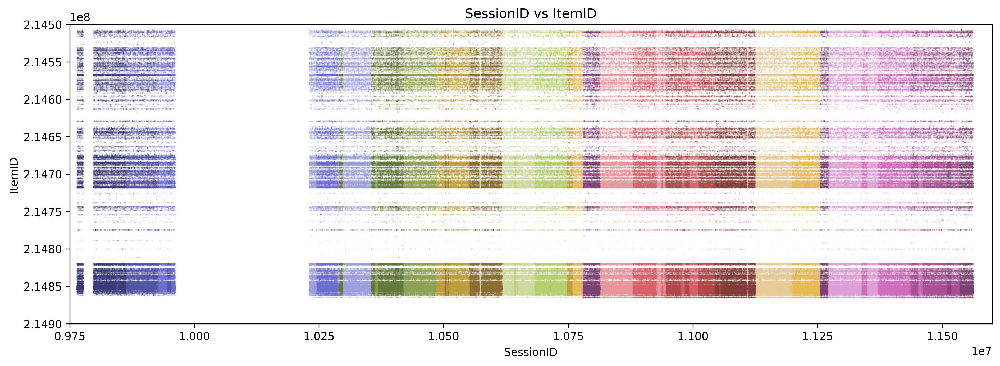

In [106]:
plt.figure(figsize=(15,5),dpi=300)
plt.scatter(df.SessionID,df.ItemID, c=df.index, alpha=0.1, s=0.1 ,cmap='tab20b')
plt.title('SessionID vs ItemID')
plt.xlabel("SessionID")
plt.ylabel("ItemID")
plt.xlim(0.975e7,1.16e7)
plt.ylim(2.149e8,2.145e8)
plt.show()

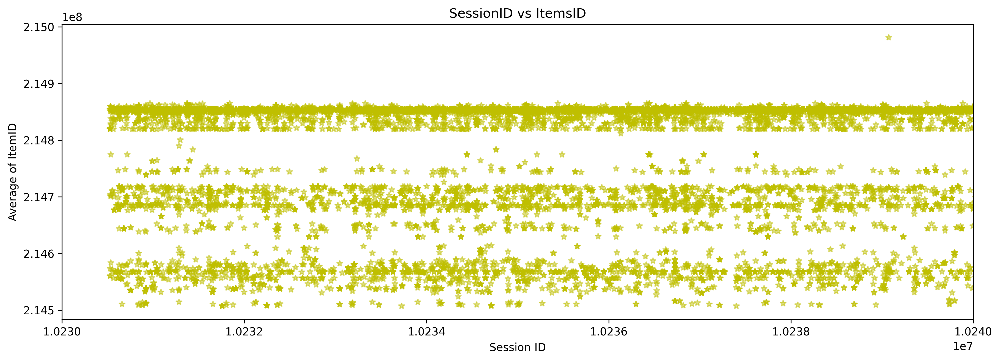

In [78]:
plt.figure(figsize=(15,5),dpi=300)
plt.plot(df.SessionID,df.ItemID,'y*',alpha=0.5)
plt.title("SessionID vs ItemsID")
plt.xlabel("Session ID")
plt.ylabel("Average of ItemID")
plt.xlim(1.023e7,1.024e7)
plt.show()

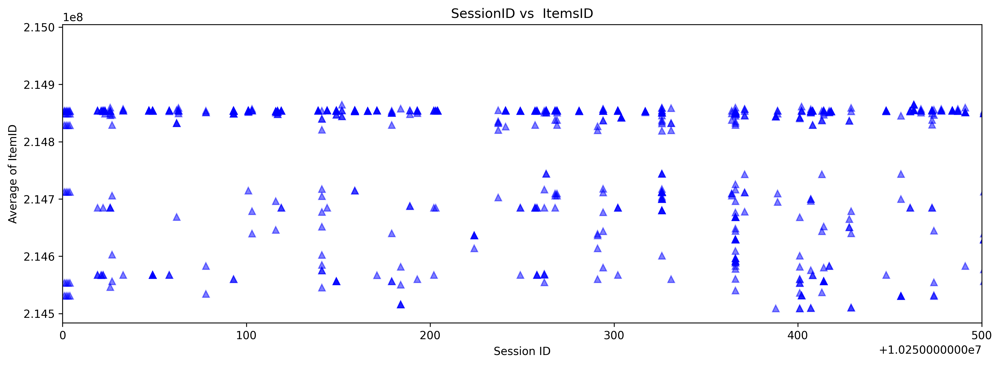

In [87]:
import matplotlib.style as mplstyle
mplstyle.use('fast')
plt.figure(figsize=(15,5),dpi=300)
plt.plot(df.SessionID,df.ItemID,'b^',alpha=0.5)
plt.title("SessionID vs  ItemsID")
plt.xlabel("Session ID")
plt.ylabel("Average of ItemID")
plt.xlim(1.025e7,1.02505e7)
plt.show()

Session IDs are also sparse therefore there is this gap between sessions.

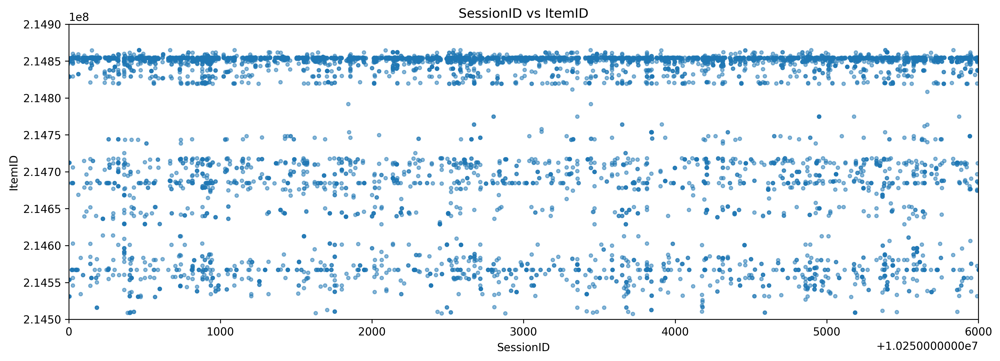

In [64]:
plt.figure(figsize=(15,5),dpi=300)
plt.scatter(df.SessionID,df.ItemID, alpha=0.5, s=10 ,cmap='tab20b')
plt.title('SessionID vs ItemID')
plt.xlabel("SessionID")
plt.ylabel("ItemID")
plt.xlim(1.025e7,1.0256e7)
plt.ylim(2.145e8,2.149e8)
plt.show()

Highest concentration on the last clicks. 

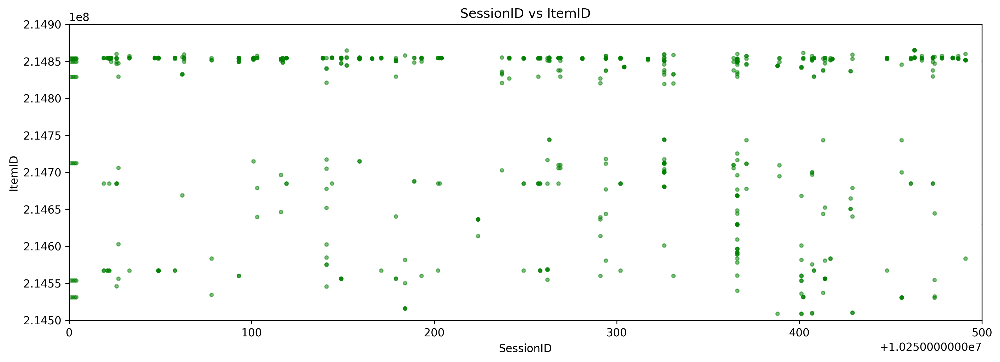

In [66]:
plt.figure(figsize=(15,5),dpi=300)
plt.scatter(df.SessionID,df.ItemID, alpha=0.5, s=10 ,c='g')
plt.title('SessionID vs ItemID')
plt.xlabel("SessionID")
plt.ylabel("ItemID")
plt.xlim(1.025e7,1.02505e7)
plt.ylim(2.145e8,2.149e8)
plt.show()

It is thus clear from here that the user behaviour is more focused on the last click and hence the assumption of stamp is justified, but it is also evident that a session is a sequential progression and hence the general interest is important as well, as it captures how the sequence is processed, whereas the last clip captures where the temporal interest of the user lies. 

In [91]:
from pandasql import sqldf
mysql = lambda q: sqldf(q, globals())

In [120]:
df.SessionID.unique()


array([ 9773199,  9773194,  9773238, ..., 11299828, 11299827, 11299813],
      dtype=int64)

In [134]:
seq2=mysql('SELECT * FROM df WHERE SessionID = 9773199 ORDER BY Time ;')

In [135]:
seq3=mysql('SELECT * FROM df WHERE SessionID = 9773194 ORDER BY Time ;')

In [136]:
seq4=mysql('SELECT * FROM df WHERE SessionID = 9773238 ORDER BY Time;')

In [137]:
seq5=mysql('SELECT * FROM df WHERE SessionID = 9764899 ORDER BY Time ;')

In [144]:
seq6=mysql('SELECT * FROM df WHERE SessionID = 9764893 ORDER BY Time;')

In [139]:
seq7=mysql('SELECT * FROM df WHERE SessionID = 11562101 ORDER BY Time;')

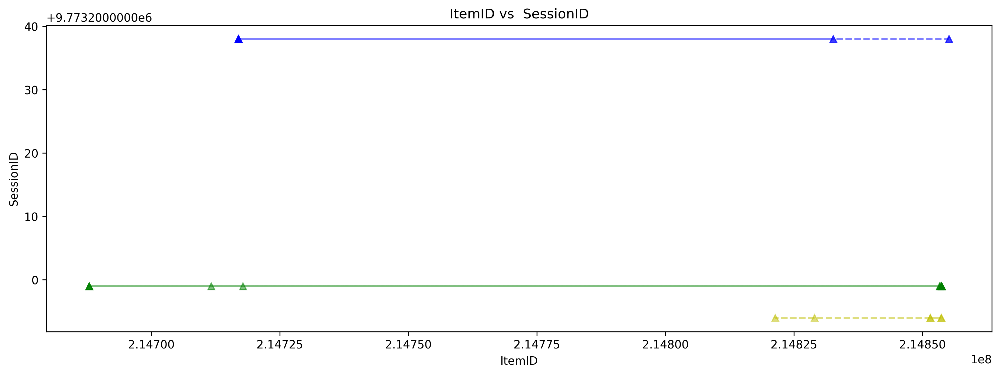

In [168]:

plt.figure(figsize=(15,5),dpi=300)
plt.plot(seq2.ItemID,seq2.SessionID,'g^--',alpha=0.5)
plt.plot(seq3.ItemID,seq3.SessionID,'y^--',alpha=0.5)
plt.plot(seq4.ItemID,seq4.SessionID,'b^--',alpha=0.5)
plt.title("ItemID vs  SessionID")
plt.xlabel("ItemID")
plt.ylabel("SessionID")
plt.show()

#### Since the line is not dashed it means that there was a coming and going back by the user but still the highes probablity of clicks are still either in the begining or the end. 

#### If the dashed line appears it means that the person has not travelled back.

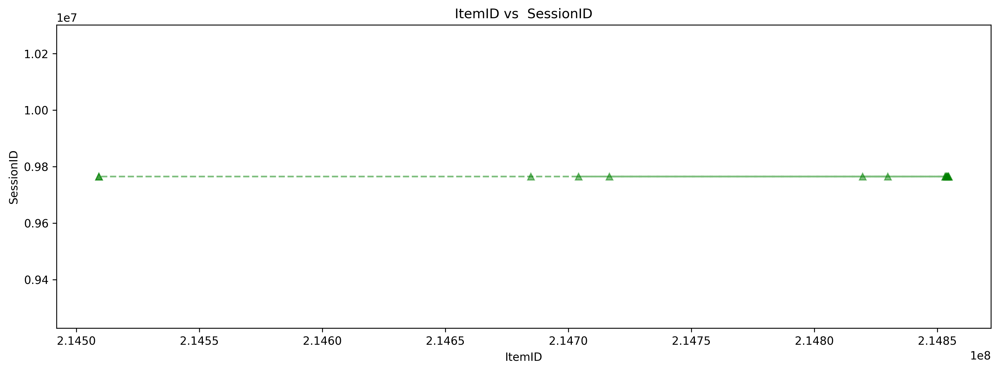

In [160]:
plt.figure(figsize=(15,5),dpi=300)
plt.plot(seq5.ItemID,seq5.SessionID,'g^--',alpha=0.5)
plt.title("ItemID vs  SessionID")
plt.xlabel("ItemID")
plt.ylabel("SessionID")
plt.ylim()
plt.show()

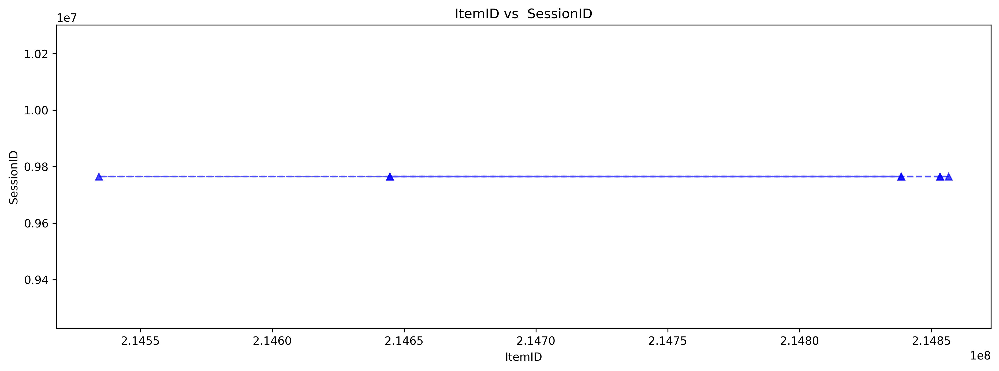

In [163]:
plt.figure(figsize=(15,5),dpi=300)
plt.plot(seq6.ItemID,seq6.SessionID,'b^--',alpha=0.7)
plt.title("ItemID vs  SessionID")
plt.xlabel("ItemID")
plt.ylabel("SessionID")
plt.ylim()
plt.show()

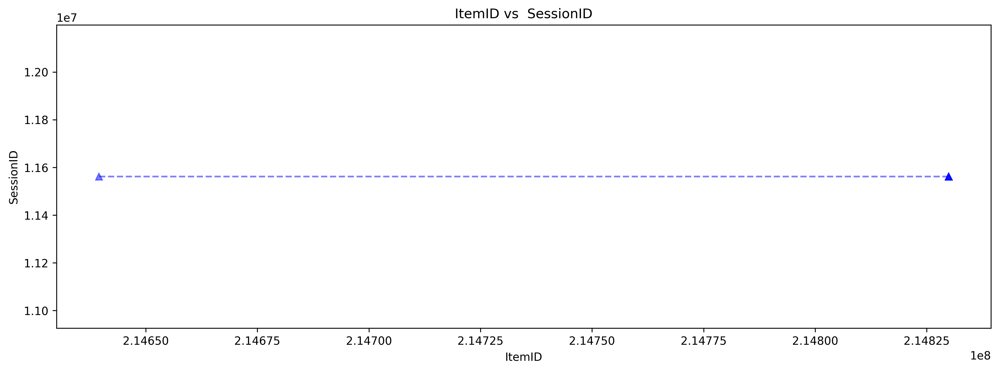

In [166]:
plt.figure(figsize=(15,5),dpi=300)
plt.plot(seq7.ItemID,seq7.SessionID,'b^--',alpha=0.5)
plt.title("ItemID vs  SessionID")
plt.xlabel("ItemID")
plt.ylabel("SessionID")
plt.show()

In [171]:
seq8=mysql('SELECT * FROM df WHERE SessionID = 10454248 ORDER BY Time;')

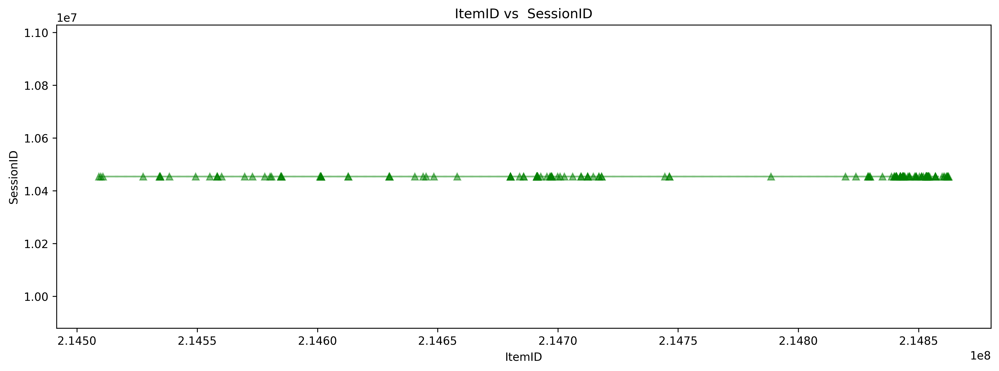

In [172]:
plt.figure(figsize=(15,5),dpi=300)
plt.plot(seq8.ItemID,seq8.SessionID,'g^--',alpha=0.5)
plt.title("ItemID vs  SessionID")
plt.xlabel("ItemID")
plt.ylabel("SessionID")
plt.show()

If we find a general interest we loose these points of interests in between the general interests and the last click, whcih may be becasue our model is not predicting the result in the whole possible range therefore I think that maybe taking in the first click will make us loose some generality but it will give us a wider range of prediction as well. 